# Pix2Pix

- 조건부 적대 네트워크를 사용한 이미지-이미지 변환에 설명 된대로 조건부 GAN을 사용하여 이미지를 이미지로 변환하는 방법

- 이 기술을 사용하여 흑백 사진에 색을 입히고 Google지도를 Google 어스로 변환하는 등의 작업을 수행 할 수 있음

- 아래의 사진처럼 건물의 외관을 실제 건물로 변환할 수 있음

  <img src="https://www.tensorflow.org/images/gan/pix2pix_1.png">

  <img src="https://www.tensorflow.org/images/gan/pix2pix_2.png">

In [1]:
import tensorflow as tf
import os, time
import matplotlib.pyplot as plt
from IPython import display

## 데이터셋 로드

- 임의 jittering에서 286x286 크기의 이미지가 무작위로 256x256으로 잘림

- 랜덤 미러링에서는 이미지가 좌우로 무작위로 반전됨

- http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz

In [2]:
url = 'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz'
path_to_zip = tf.keras.utils.get_file('facades.tar.gz', origin=url, extract=True)

30179328/30168306 [==============================] - 54s 2us/step


In [3]:
PATH = os.path.join(os.path.dirname(path_to_zip), 'facades/')
BUFFER_SIZE, BATCH_SIZE = 400, 1
IMG_WIDTH, IMG_HEIGHT = 256, 256

In [4]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)

    w = tf.shape(image)[1] // 2
    
    real_image = image[:, :w, :]
    input_image = image[:, w:, :]

    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

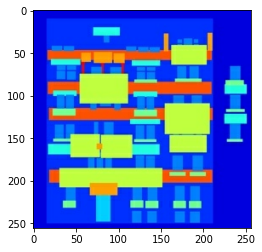

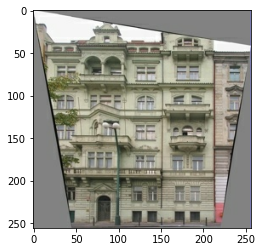

In [5]:
inp, re = load(PATH+'train/100.jpg')
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [6]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return input_image, real_image

In [7]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
    return cropped_image[0], cropped_image[1]

- 이미지를 [-1, 1] 사이의 값으로 정규화

In [8]:
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    return input_image, real_image

In [9]:
@tf.function
def random_jitter(input_image, real_image):
    input_image, real_image = resize(input_image, real_image, 286, 286)
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
    return input_image, real_image

- 아래 이미지에서 볼 수 있듯이 무작위 지터링을 겪고 있음을 알 수 있음

  1. 더 큰 높이와 너비로 이미지 크기 조정

  2. 대상 크기로 무작위로 자르기

  3. 이미지를 가로로 무작위로 뒤집기

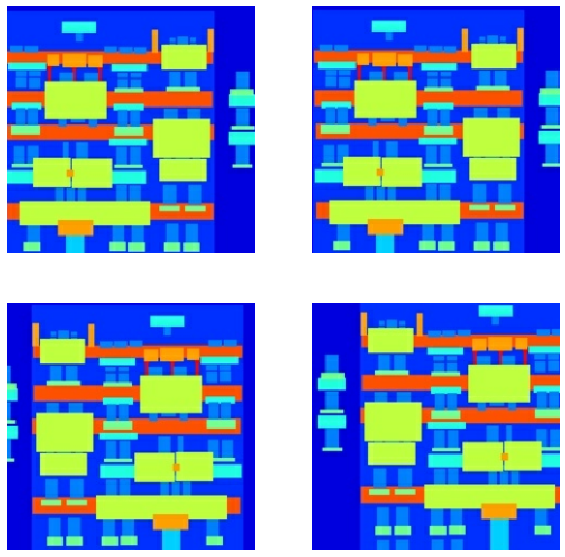

In [10]:
plt.figure(figsize=(10,10))
for i in range(4):
    rj_inp, rj_re = random_jitter(inp, re)
    plt.subplot(2, 2, i+1)
    plt.imshow(rj_inp/255.)
    plt.axis('off')
plt.show()

In [11]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

In [12]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

## 입력 파이프라인
- `tf.data.Dataset`을 이용하여 train, test dataset을 생성

In [13]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [14]:
test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## 생성기 구축

- 제너레이터의 아키텍처는 수정 된 U-Net입니다.

- 인코더의 각 블록은 (Conv-> Batchnorm-> Leaky ReLU)

- 디코더의 각 블록은 (Transposed Conv-> Batchnorm-> Dropout (처음 3 개 블록에 적용)-> ReLU)

- 인코더와 디코더 사이에는 스킵 연결이 있음(U-Net에서와 같이).

In [15]:
OUTPUT_CHANNELS = 3

In [16]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [17]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
down_result.shape

TensorShape([1, 128, 128, 3])

In [18]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

In [19]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
up_result.shape

TensorShape([1, 256, 256, 3])

In [20]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [downsample(64, 4, apply_batchnorm=False),
                  downsample(128, 4),
                  downsample(256, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4)]
    up_stack = [upsample(512, 4, apply_dropout=True),
                upsample(512, 4, apply_dropout=True),
                upsample(512, 4, apply_dropout=True),
                upsample(512, 4),
                upsample(256, 4),
                upsample(128, 4),
                upsample(64, 4)]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                           kernel_initializer=initializer, activation='tanh')
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

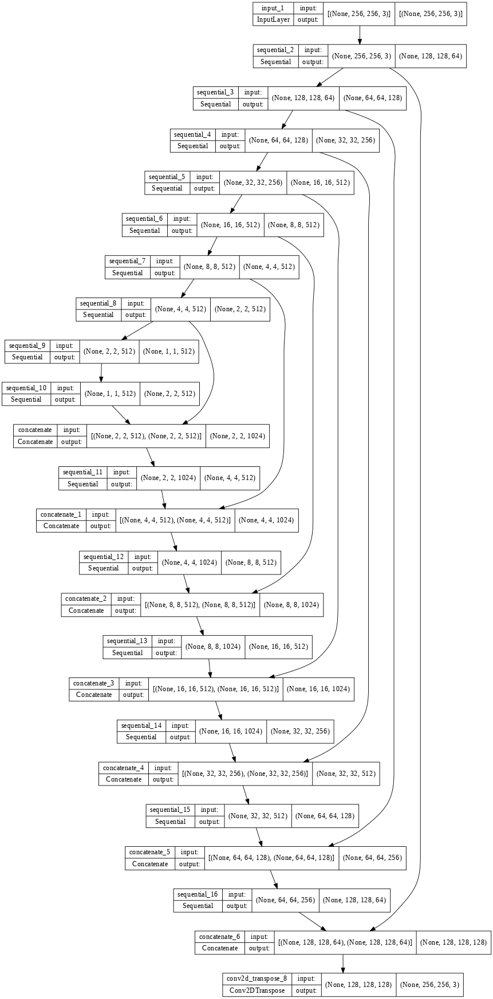

In [21]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


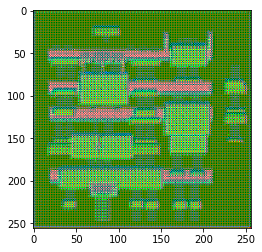

In [22]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...]);

- Generator 손실

  - 생성 된 이미지와 이미지 배열의 시그모이드 교차 엔트로피 손실

  - 논문에는 생성 된 이미지와 대상 이미지 사이의 MAE (평균 절대 오차) 인 L1 손실도 포함

  - 이렇게하면 생성된 이미지가 대상 이미지와 구조적으로 유사 해짐

  - 총 generator loss을 계산하는 공식 = gan_loss + LAMBDA * l1_loss, 여기서 LAMBDA = 100.이 값은 논문 저자가 결정함

In [23]:
LAMBDA = 100

In [24]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target-gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

<img src="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1">


## 판별자 구축

- 판별자는 PatchGAN

- 식별기의 각 블록은 (Conv-> BatchNorm-> Leaky ReLU)

- 마지막 레이어 이후의 출력 모양은 (batch_size, 30, 30, 1)

- 출력의 각 30x30 패치는 입력 이미지의 70x70 부분을 분류 (이러한 아키텍처를 PatchGAN이라고 함)

- 판별기는 2 개의 입력을 받음

  - 실제로 분류해야하는 입력 이미지와 대상 이미지

  - 입력 이미지와 생성된 이미지 (생성기의 출력)를 가짜로 분류

  - 이 두 입력을 코드에서 함께 연결 (`tf.concat([inp, tar], axis=-1)`).

In [25]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256,256,3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256,256,3], name='target_image')
    x = tf.keras.layers.concatenate([inp,tar])

    x = downsample(64, 4, False)(x)
    x = downsample(128, 4)(x)
    x = downsample(256, 4)(x)
    x = tf.keras.layers.ZeroPadding2D()(x)
    x = tf.keras.layers.Conv2D(512, 4, strides=1,
                               kernel_initializer=initializer, use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.ZeroPadding2D()(x)
    x = tf.keras.layers.Conv2D(1, 4, strides=1,
                               kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs=[inp, tar], outputs=x)

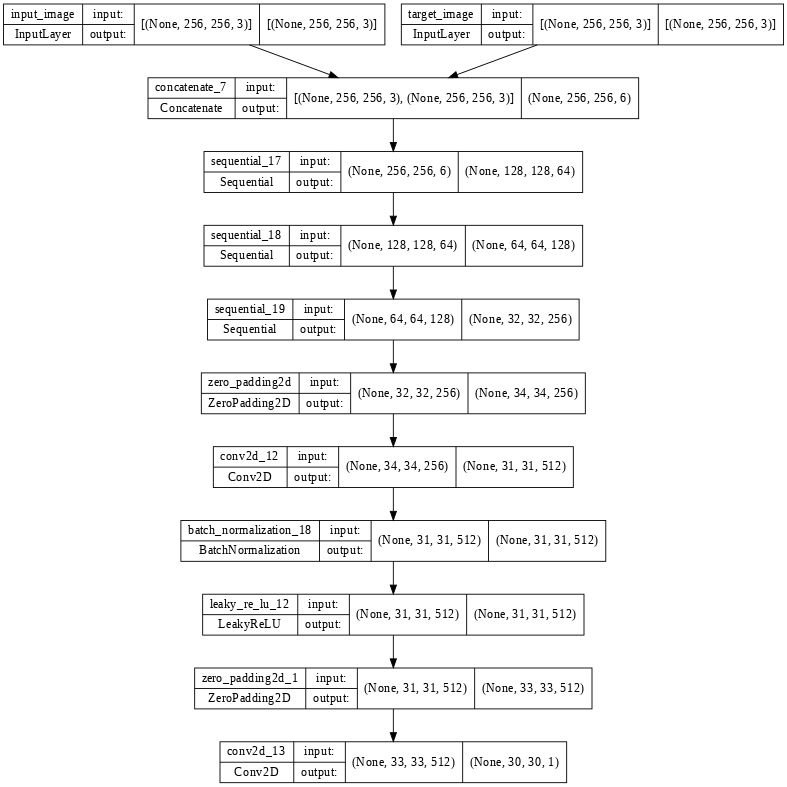

In [26]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

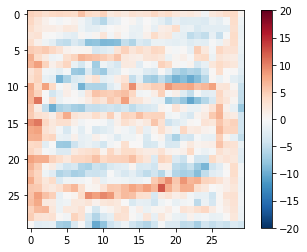

In [27]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar();

## 판별자 손실

- 판별기 손실 함수는 2 개의 입력을 받음
  - 실제 이미지
  
  - 생성 된 이미지

- real_loss는 **실제 이미지**와 **이미지의 배열**의 시그모이드 교차 엔트로피 손실(**실제 이미지 이므로**)

- generated_loss는 **생성된 이미지**와 **0의 배열**의 시그모이드 교차 엔트로피 손실(**가짜 이미지이기 때문에**)

- total_loss는 real_loss와 generated_loss의 합

In [28]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [29]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

- 판별자에 대한 학습 절차

  <img src="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1">
  

## 옵티마이저 설정

- 생성자, 판별자

  - Adam

  - $lr = 2e-4$
  
  - $beta_1 = 0.5$


In [30]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

- 체크포인트 설정

In [31]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## 이미지 생성

- 훈련 중에 일부 이미지를 그리는 함수를 작성

  - 테스트 데이터 세트의 이미지를 생성기로 전달

  - 생성기는 입력 이미지를 출력으로 변환

  - 마지막 단계는 예측을 그리는 것

In [32]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    plt.figure(figsize=(15,5))
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

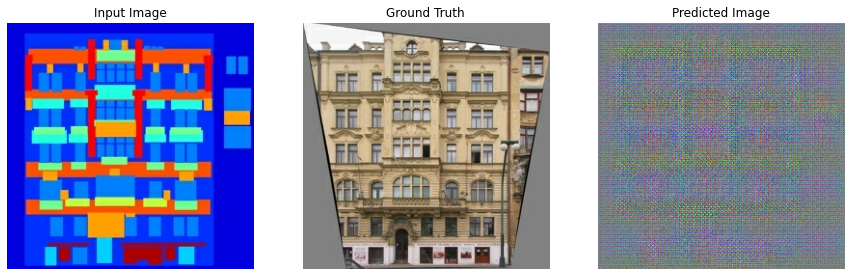

In [33]:
for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

## 학습

- 학습 과정

  - 각 예제 입력에 대해 출력을 생성

  - 판별기는 input_image와 생성된 이미지를 첫 번째 입력으로 받음

  - 두 번째 입력은 input_image 및 target_image

  - 생성기와 판별기 손실을 계산
  
  - 그런 다음 생성기 및 판별 변수 (입력)에 대한 손실의 기울기를 계산하고이를 최적화기에 적용

  - 손실을 TensorBoard에 기록

In [34]:
EPOCHS = 150

In [35]:
from datetime import datetime
log_dir = 'logs/'
summary_writer = tf.summary.create_file_writer(log_dir + 'fit/' + datetime.now().strftime('%Y%m%d-%H%M%S'))

In [36]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

- 실제 훈련 루프

  - Epoch 수를 반복

  - 각 epoch에서 디스플레이를 지우고 generate_images 를 실행 generate_images 진행 상황을 표시

  - 각 에포크에서 학습 데이터 세트를 반복하여 '.'를 출력
  - 20 epoch마다 체크 포인트를 저장

In [37]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()
        display.clear_output(wait=True)
        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print('Epoch:', epoch)

        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            train_step(input_image, target, epoch)
        print()

        if (epoch+1) % 20 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print(f'Time taken for epoch {epoch+1} is {time.time()-start:.2f} sec.\n')
    
    checkpoint.save(file_prefix=checkpoint_prefix)

In [38]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

- 위에 표시되는 Tensorboard에서 새로고침을 누르면 그래프가 reload됨

- 학습 시간 매우 많이 소요

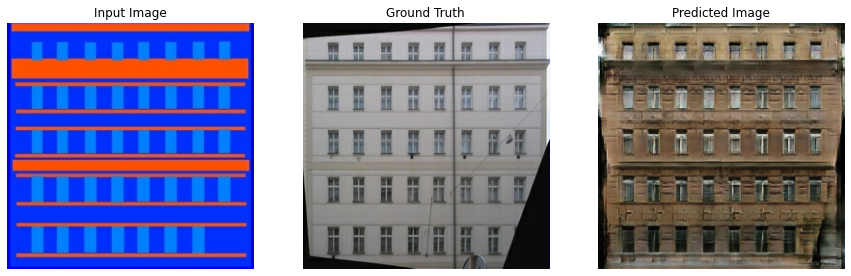

Epoch: 149
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

Time taken for epoch 150 is 39.54993486404419 sec.



In [39]:
fit(train_dataset, EPOCHS, test_dataset)

## 최신 checkpoints 복원 및 test

In [40]:
ls {checkpoint_dir}

checkpoint                  ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index                ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index                ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index                ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [41]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## 테스트 데이터셋을 사용하여 이미지 생성

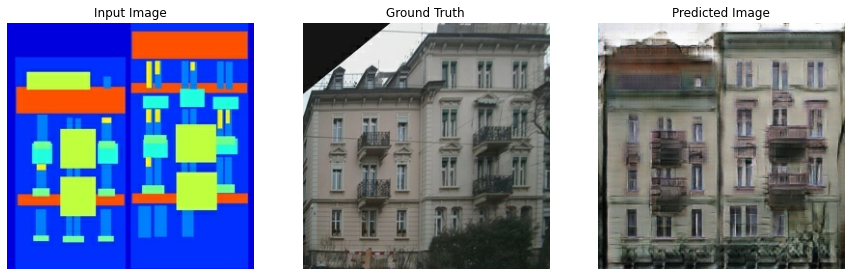

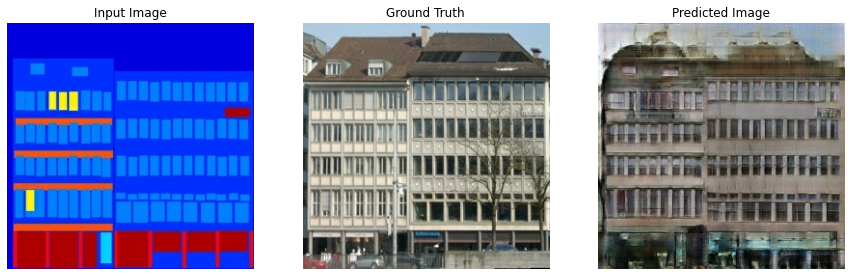

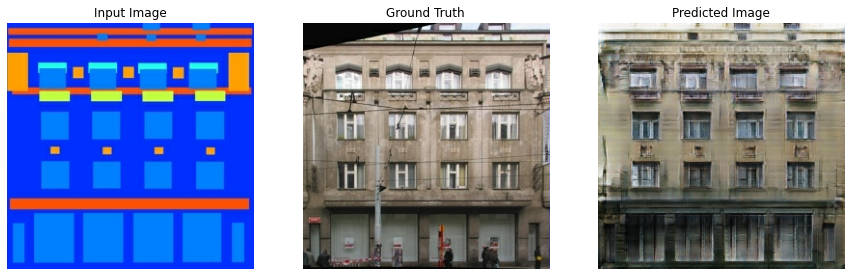

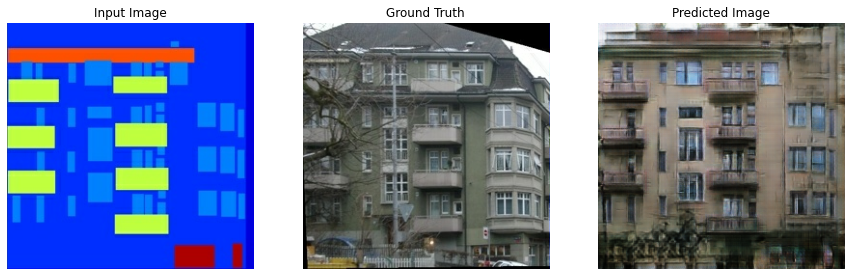

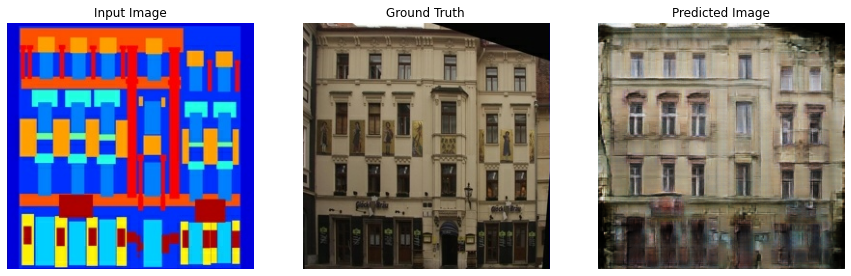

In [42]:
for src, dst in test_dataset.take(5):
    generate_images(generator, src, dst)